# Summary

<p>
This project considers machine learning workflows.<br>
It integrates data visualization, exploration, modeling with XGBoost and other subjects.
</p>

<p>
Techniques, packages and algos applied here are include for example
</p>
    
<ul>
  <li>Pandas</li>
  <li>Matplotlib, Seaborn, Ploty</li>
  <li>Scikit</li>
  <li>XGBoost</li>
  <li>GridSearch</li>
  <li>train-test-splitting</li>
  <li>cross-Validation</li>
  <li>Encoding</li>
  <li>ML pipelines</li>
  <li>Regression</li>
  <li>Logistic regression</li>
  <li>Regularization</li>
  <li>Sampling distribution</li>
</ul> 

<p>Comments are given directly in the markup cells of the notebook.</p>

# Importing packages

#### Importing base packages

In [104]:

import pandas as pd
import pandasql
from pandasql import sqldf

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import numpy as np
import os as os
import time
import pprint
import sys
import re
import json

In [105]:
cwd=os.getcwd()
print(cwd)

C:\Users\gamarandor\data_science\data_science_projects\data_camp_projects\XGBoost_1


#### Importing Scikit and XGBoost

In [106]:
import xgboost as xgb # XGBoost typically uses the alias "xgb"

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

from sklearn.feature_selection import RFE
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import OneHotEncoder

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline

import joblib

#### Importing Plotly

In [107]:
# !jupyter labextension install @jupyter-widgets/jupyterlab-manager jupyterlab-plotly

In [108]:
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)
# pyo.init_notebook_mode()

# plotly
import plotly
import plotly.express as px
# plotly.tools.set_credentials_file(username = '****', api_key = '************')

import plotly.io as pio

import chart_studio.plotly as py
import plotly.graph_objects as go


# Set notebook mode to work in offline
import plotly.offline as pyo
pyo.init_notebook_mode()

import plotly.io as pio
print(pio.renderers)


from plotly.subplots import make_subplots

pio.renderers.default = 'jupyterlab'


Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



In [109]:
print(pio.templates)

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']



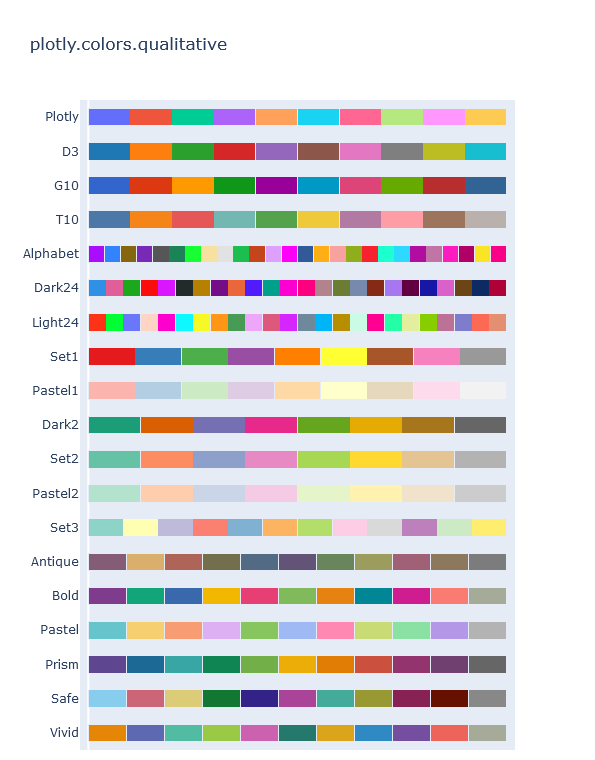

In [110]:
fig = px.colors.qualitative.swatches()
fig.show()

## Predict the price variable with the XGBOOST-algo on Boston housing data
<p>
The XGBOOST tree-ensemble algo combines stepwise several weak learners for optimizing the accuracy of the results.<br>
Learners are decision trees.<br>
The data segmentations of weak learners results in correct predictions of only ca. 50 percent.<br>
This is random.<br>
In the next step the focus is set on the weak learners.<br>
Those are weighted higher.<br> 
Intuitively the expectations is to follow the strong learners, which are prouducing the better results.<br>
The genius of XGBOOST is to do the opposite.
</p>    
<p>
An introduction to Boosted Trees is given here: <a href="https://xgboost.readthedocs.io/en/latest/tutorials/model.htmlhttps://www.w3schools.com" target="_blank">xgboost.readthedocs</a> 
</p> 

### Boston importing

In [111]:
from sklearn.datasets import load_boston

In [112]:
boston = load_boston()
print(type(boston))

<class 'sklearn.utils.Bunch'>


In [113]:
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

<p>The target variable price is in the target feature.</p>

In [114]:
print(type(boston.data))
print(boston.data.shape)
print(boston.data[:1])

<class 'numpy.ndarray'>
(506, 13)
[[6.320e-03 1.800e+01 2.310e+00 0.000e+00 5.380e-01 6.575e+00 6.520e+01
  4.090e+00 1.000e+00 2.960e+02 1.530e+01 3.969e+02 4.980e+00]]


### Boston data exploration

#### Columns

In [115]:
boston.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

#### Boston meta data

In [116]:
boston_description = boston.DESCR
print(type(boston_description))
print(boston_description[:1200])

<class 'str'>
.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
       

In [117]:
boston_df = pd.DataFrame(data=boston.data, columns=boston.feature_names)

print(type(boston_df))
boston_df.head(2)

<class 'pandas.core.frame.DataFrame'>


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.9,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.9,9.14


#### Adding the price variable stored in target

In [118]:
boston_price = boston.target
boston_df['price'] = boston_price

In [119]:
boston_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  price    506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


In [120]:
boston_df.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
price      float64
dtype: object

<p>All features are floats. Encoding is not necessary.</p>

In [121]:
boston_df.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
price      0
dtype: int64

<p>Data is without missing values.<br>
Imputing is not necessary.</p>

In [122]:
boston_statistics = boston_df.describe()

boston_statistics.iloc[:2, :5]

,CRIM,ZN,INDUS,CHAS,NOX
count,506.000000,506.000000,506.000000,506.00000,506.000000
mean,3.613524,11.363636,11.136779,0.06917,0.554695


In [123]:
boston_df_melted=boston_df.melt()

print(boston_df_melted.shape)
print(boston_df.shape)
print(506*13)

(7084, 2)
(506, 14)
6578


In [124]:
boston_df_melted.columns.tolist()

['variable', 'value']

### Boston features distributions

#### Distribution of CRIM - per capita crime rate by town

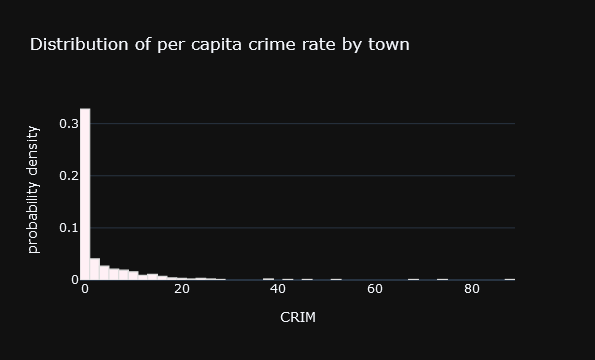

In [125]:
capita_crime = px.histogram(boston_df, x="CRIM", color_discrete_sequence=['lavenderblush'],
                            title='Distribution of per capita crime rate by town',
                            histnorm='probability density', template='plotly_dark',
                            width=400, height=300)
capita_crime .update_traces(marker_line_width=1.23, marker_line_color="gainsboro")
capita_crime.show()


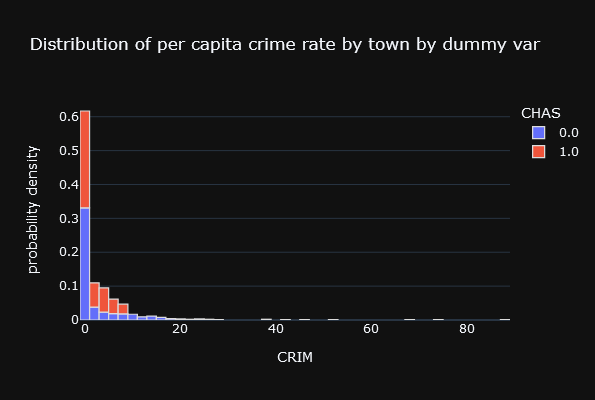

In [126]:
capita_crime = px.histogram(boston_df, x="CRIM",
                            title="Distribution of per capita crime rate by town by dummy var", 
                            color = 'CHAS',
                            histnorm='probability density', template='plotly_dark',
                            width=600, height=400)
capita_crime .update_traces(marker_line_width=1.23, marker_line_color="gainsboro")
capita_crime.show()

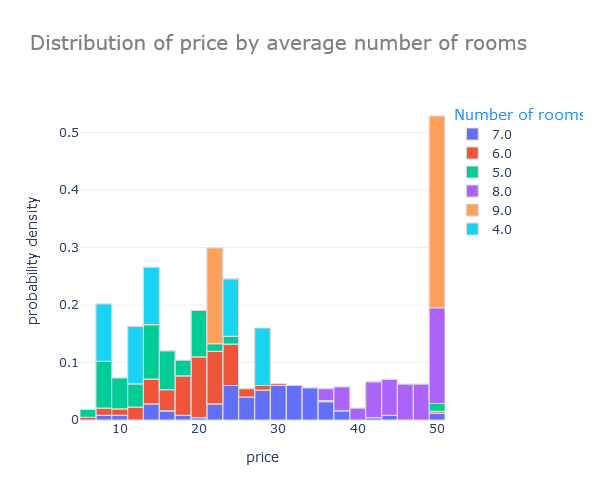

In [127]:
capita_crime = px.histogram(boston_df, x="price",
                            title="Distribution of price by average number of rooms", 
                            color = boston_df['RM'].round(0),
                            histnorm='probability density', template='plotly_white',
                            width=700, height=500)

capita_crime.update_traces(marker_line_width=1.23, marker_line_color="gainsboro")

capita_crime.update_layout(
                            title_font_size=20,
                            title_font_color="gray",
                            legend_title="Number of rooms",
                            legend_title_font_size=15,
                            legend_title_font_color="dodgerblue"
                            )
capita_crime.show()

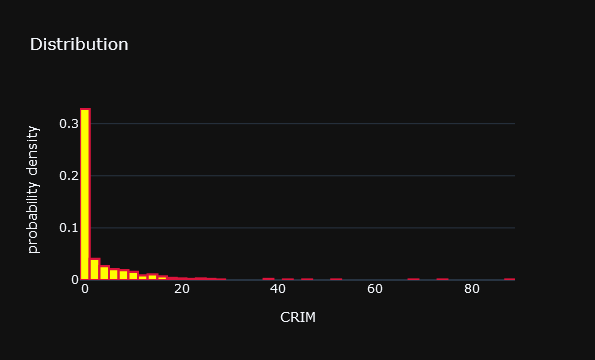

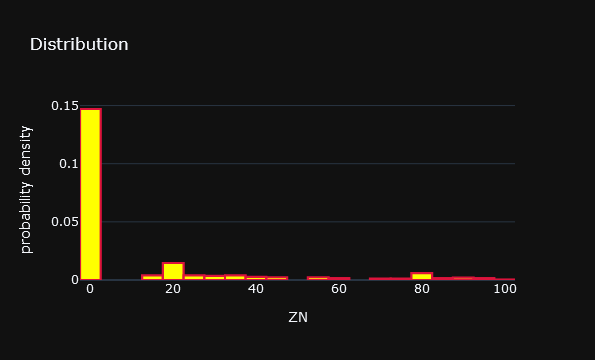

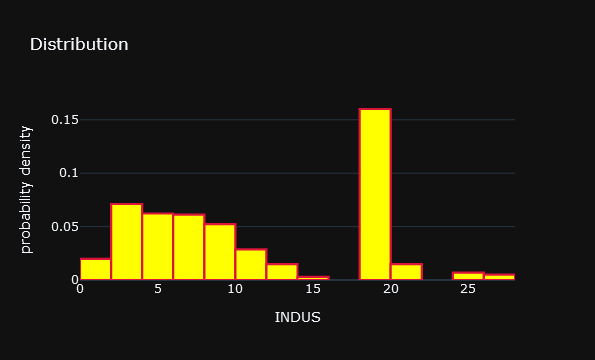

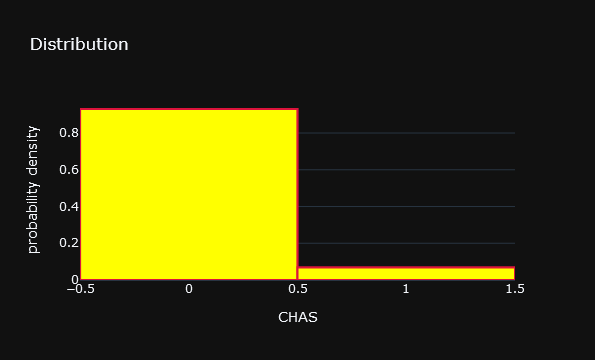

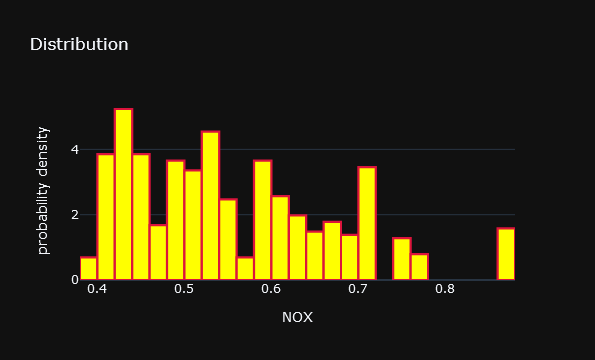

...

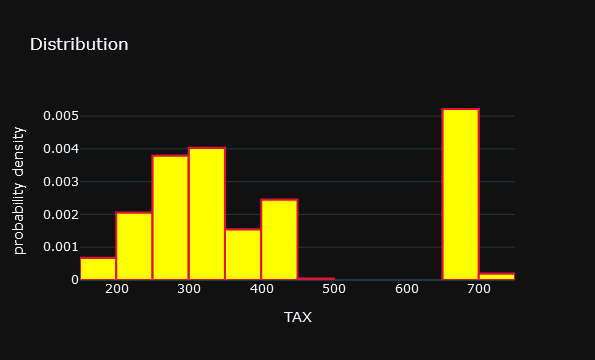

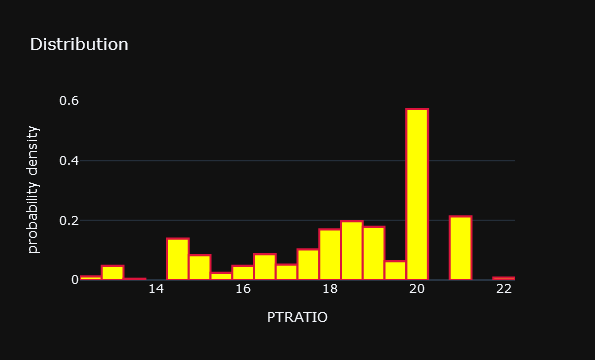

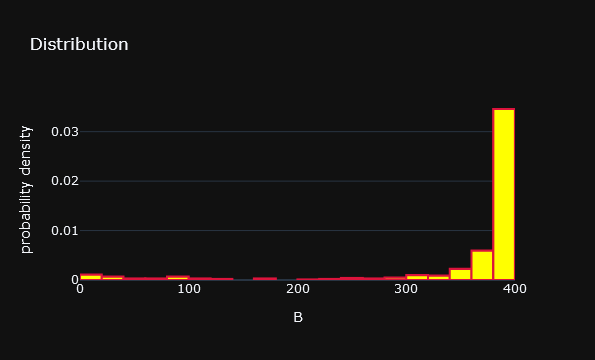

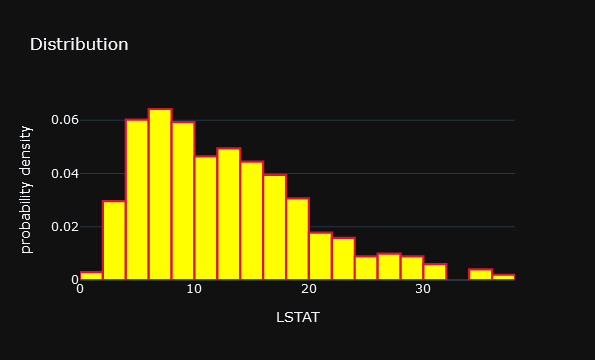

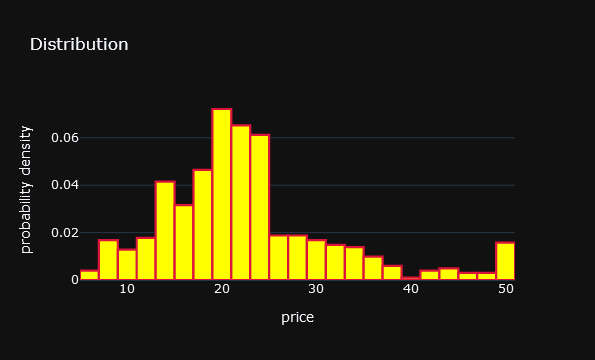

In [128]:
for col in boston_df.columns.tolist():
            boston_dis = px.histogram(boston_df, 
                     x=col, color_discrete_sequence=['yellow'],
                     title='Distribution',
                     histnorm='probability density', template='plotly_dark',
                     width=400, height=300)
            boston_dis.update_traces(marker_line_width=2.23, marker_line_color="crimson")
            boston_dis.show()
    

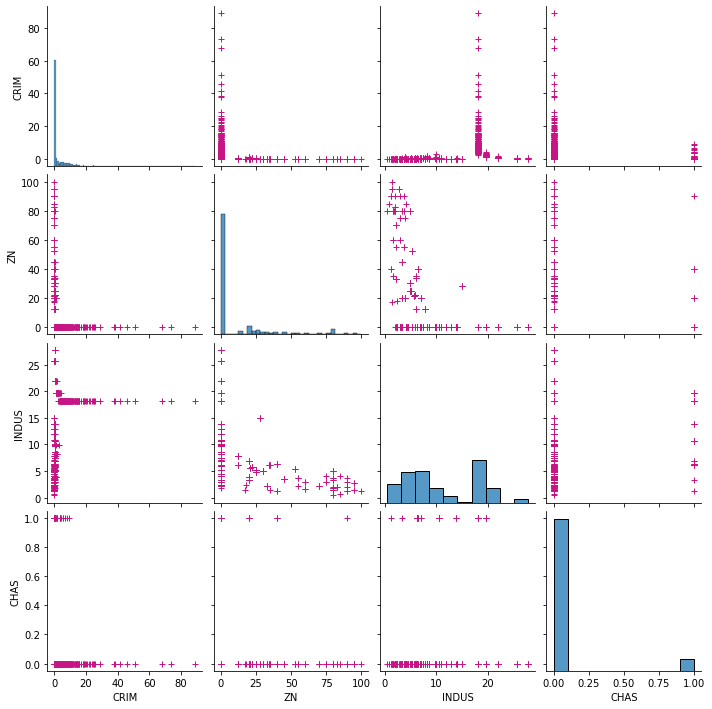

In [129]:
sns.pairplot(boston_df.iloc[:,:4], kind='scatter',
             plot_kws=dict(marker="+", linewidth=1, color=['mediumvioletred'], 
                           edgecolor='black'))
plt.show()

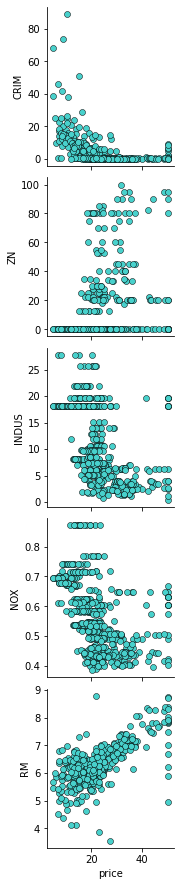

In [130]:
sns.pairplot(data=boston_df, x_vars=['price'], y_vars=boston_df.iloc[:,[0,1,2,4,5]], kind='scatter',
             plot_kws=dict(edgecolor='black', color='mediumturquoise'))
plt.show()

#### Correlations
<p>can give indications about features with a good predictive power.<br>
Feature engineering, while essential, is not examined further here.</p>

In [131]:
boston_correlations = boston_df.corr()

print(boston_correlations.shape)
boston_correlations.iloc[:5, :8]

(14, 14)


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230


#### pandas.core.style.Styler.background_gradient
<a href="https://pandas.pydata.org/pandas-docs/version/0.17.1/generated/pandas.core.style.Styler.background_gradient.html" target="_blank">Pandas
</a> 

In [132]:
boston_correlations.style.background_gradient(cmap='coolwarm')

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,price
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


<p>Highly correleated features could point to the phenomenon of Multicollinearity:</p>
<p>
"That is, a multivariate regression model with collinear predictors can indicate how well the entire bundle of predictors predicts the outcome variable, but it may not give valid results about any individual predictor, or about which predictors are redundant with respect to others."</p>
<a href="https://en.wikipedia.org/wiki/Multicollinearity" target="_blank">Wikipedia</a> 

#### Correlation with price

In [133]:
boston_price_corr = boston_df.corrwith(boston_df['price'])
boston_price_corr_df = pd.DataFrame(boston_price_corr)
boston_price_corr_df.reset_index(inplace=True)
boston_price_corr_df.columns = ['Features', 'Correlation']

In [134]:
boston_price_corr_df_colored = boston_price_corr_df.style.background_gradient(cmap='coolwarm')
boston_price_corr_df_colored

,Features,Correlation
0,CRIM,-0.388305
1,ZN,0.360445
2,INDUS,-0.483725
3,CHAS,0.175260
4,NOX,-0.427321
5,RM,0.695360
6,AGE,-0.376955
7,DIS,0.249929
8,RAD,-0.381626
9,TAX,-0.468536


#### Min-Max-correlations

In [135]:
boston_price_corr_df_max = boston_price_corr_df.iloc[0:13,:]
boston_price_corr_df_max
# print(boston_price_corr_df_max)

max_mask = boston_price_corr_df_max['Correlation'] == boston_price_corr_df_max['Correlation'].max()
min_mask = boston_price_corr_df_max['Correlation'] == boston_price_corr_df_max['Correlation'].min()

In [136]:
print("Maximum correlation")
print("________________________________")
print(boston_price_corr_df_max[max_mask])

Maximum correlation
________________________________
  Features  Correlation
5       RM      0.69536


In [137]:
print("Minimum correlation")
print("________________________________")
print(boston_price_corr_df_max[min_mask])

Minimum correlation
________________________________
   Features  Correlation
12    LSTAT    -0.737663


### Heatmaps
#### Seaborn

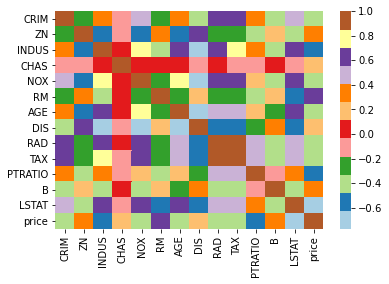

In [138]:
sns.heatmap(boston_correlations,cmap='Paired')
plt.show()

#### Plotly express

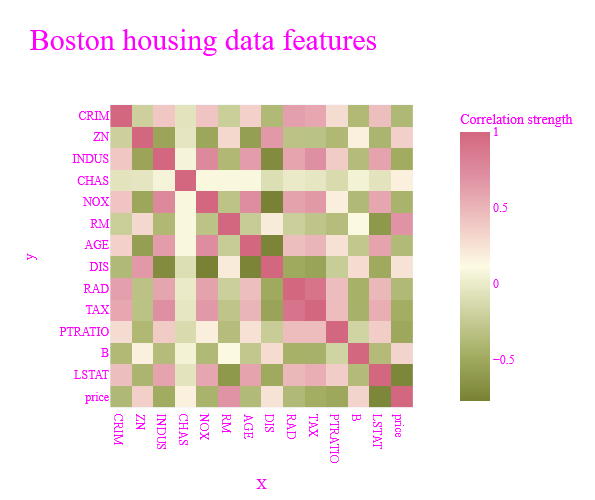

In [139]:
boston_heat = px.imshow(boston_correlations, 
                        labels=dict(x='X', y='y', color='Correlation strength'), 
                        title="Boston housing data features",
                        color_continuous_scale="armyrose" )

boston_heat.update_layout(
    font_family="Droid Sans Mono",
    font_color="fuchsia",
    title_font_family="Droid Sans Mono",
    title_font_color="fuchsia",
    title_font_size=30
)

boston_heat.update_layout(autosize=False, width=600, height=500)
boston_heat.show()

#### Boston feature corr with price

In [140]:
boston_corr_colNames = boston_price_corr_df.Features.tolist()
boston_cor_values = boston_price_corr_df.Correlation.values
boston_cor_colPrice = np.repeat('Price', len(boston_cor_values))

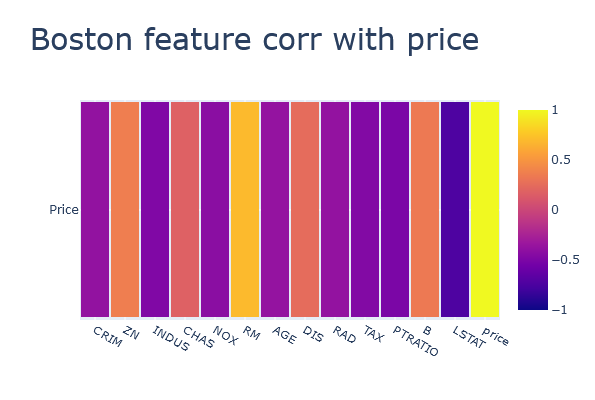

In [141]:
boston_goHeatmap = \
go.Figure(go.Heatmap(
z=boston_cor_values,
x= boston_corr_colNames,
y=boston_cor_colPrice,
zmin=-1, zmax=1
)
)
boston_goHeatmap.update_layout(autosize=False, width=600, height=400, 
                               title='Boston feature corr with price',
                               title_font_size=30, title_xanchor='left')
boston_goHeatmap.update_traces(ygap=5, xgap=2)
boston_goHeatmap.show()

<p>Features corrleated highly with the target variable price could make good features.</p>

## Machine learning with XGBOOST
### Seperating the target variable price from the features

In [142]:
boston_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  price    506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


In [143]:
boston_features = boston_df.iloc[:, :-1]
boston_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
dtypes: float64(13)
memory usage: 51.5 KB


In [144]:
boston_targetPrice = boston_df.iloc[:, -1]

print(boston_targetPrice.shape)
print(type(boston_targetPrice))
boston_targetPrice.head()

(506,)
<class 'pandas.core.series.Series'>


0    24.0
1    21.6
2    34.7
3    33.4
4    36.2
Name: price, dtype: float64

#### DMatrix
<p>a data structure optimized for XGBOOST.</p>

In [145]:
boston_dmatrix = xgb.DMatrix(data=boston_features, label=boston_targetPrice)
print(type(boston_dmatrix))

<class 'xgboost.core.DMatrix'>


#### Memory adress

In [146]:
boston_dmatrix

#### Train-test-split

In [147]:
X_train_boston, X_test_boston, y_train_boston, y_test_boston =\
train_test_split(boston_features, boston_targetPrice, test_size=0.3, random_state=456)

In [148]:
print(type(X_train_boston))
print(X_train_boston.shape)

<class 'pandas.core.frame.DataFrame'>
(354, 13)


In [149]:
print(type(y_train_boston))
print(y_train_boston.shape)

<class 'pandas.core.series.Series'>
(354,)


#### Instantiating the XGBOOST classifier instance
<p>An overview over the general hyperparameters for tuning are given here:<br>
<a href="https://xgboost.readthedocs.io/en/latest/parameter.html#general-parameters" target="_blank">xgboost.readthedocs</a><p>     
<p>There are two main classifiers:<p>
<ul>
  <li>XGBRegressor()</li>
  <li>XGBClassifier()</li>
</ul> 

#### Penalization of models

<p>is achieved with the regularization parameters gamma, alpha and lambda.<br>
Penalization is used to prevent overfitting of complex models.<br>
Complex models are tracing easily the the distribution of the training data.<br>
In case of overfitting the model does not transfer to the test data.<br>
The doc is using says it like this for lambda:
</p>

<p>
L2 regularization term on weights. Increasing this value will make model more conservative.
</p>

In [150]:
boston_xgb_regressor = \
xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.35, learning_rate=0.01,
                 max_depth=6, alpha = 10, n_estimators = 15)

In [151]:
boston_xgb_regressor.fit(X_train_boston, y_train_boston)

XGBRegressor(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.35,
             enable_categorical=False, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.01, max_delta_step=0,
             max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=15, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [152]:
boston_predictions_1 = boston_xgb_regressor.predict(X_test_boston)

print(type(boston_predictions_1))
print(boston_predictions_1.shape)
print(X_test_boston.shape)

<class 'numpy.ndarray'>
(152,)
(152, 13)


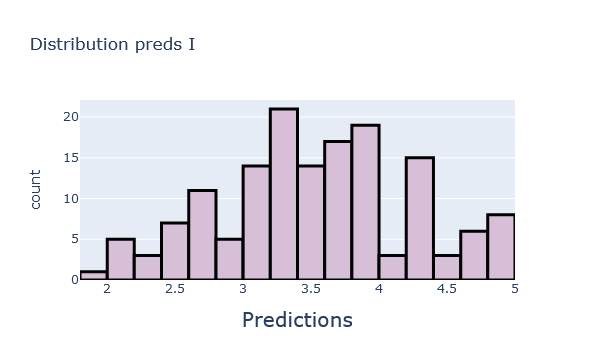

In [153]:
boston_predictions_1_distribution = \
px.histogram(boston_predictions_1,
             color_discrete_sequence=['thistle'],
             title='Distribution preds I')

boston_predictions_1_distribution.update_traces(marker_line_width=3, 
                                                marker_line_color='black')


boston_predictions_1_distribution.update_layout(xaxis_title_text="Predictions",
                                                xaxis_title_font_size=20.33453,
                                                showlegend=False)

boston_predictions_1_distribution.show()

#### Sampling distribution of boston predictions 1

<p>
because:<br>
"Even though each sample may give you an answer involving some error, the expected value is right at the target: exactly the population mean. In other words, if one does the experiment over and over again, the overall average of the sample mean is exactly the population mean.<br>
<a href="https://online.stat.psu.edu/stat500/book/export/html/509" target="_blank">online.stat.psu.edu</a> 
</p>

In [154]:
np.random.choice(boston_predictions_1,10)

array([4.4656863, 2.806617 , 4.201078 , 3.2945964, 2.8645365, 4.201078 ,
       2.7030962, 4.498636 , 4.201078 , 3.2597952], dtype=float32)

<p>Taking recurrent samples from the data.</p>

In [155]:

boston_sampling_distribution = []
for i in range(0,10000):
    boston_sample = np.random.choice(boston_predictions_1, len(boston_predictions_1))
    boston_sampling_mean = boston_sample.mean()
    boston_sampling_distribution.append(boston_sampling_mean)
    
print(type(boston_sampling_distribution))
print(len(boston_sampling_distribution))
print(boston_sampling_distribution[:5])

<class 'list'>
10000
[3.6073487, 3.4718668, 3.51839, 3.5252995, 3.5110362]


#### Point statistics of the sampling distribution

In [156]:
boston_sampling_distribution_series = pd.Series(boston_sampling_distribution)

def quantile_025(x):
    return x.quantile(0.25)

def quantile_075(x):
    return x.quantile(0.75)

boston_sampling_aggregates = \
boston_sampling_distribution_series.agg(['mean', 'median', 'std' , 
                                         quantile_025, 
                                         quantile_075])

print(type(boston_sampling_aggregates))
print(boston_sampling_aggregates.index)
print(boston_sampling_aggregates)

<class 'pandas.core.series.Series'>
Index(['mean', 'median', 'std', 'quantile_025', 'quantile_075'], dtype='object')
mean            3.523567
median          3.523618
std             0.058037
quantile_025    3.483387
quantile_075    3.563023
dtype: float64


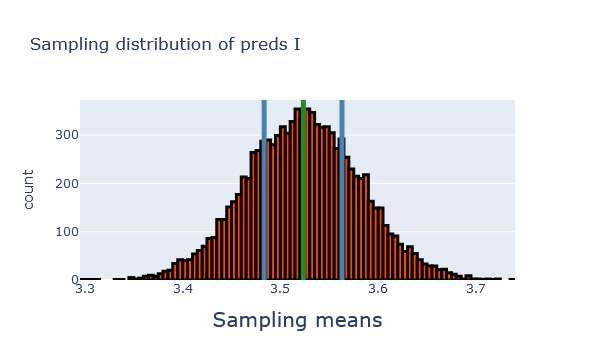

In [157]:
boston_predictions_1_distribution_sampling = \
px.histogram(boston_sampling_distribution,
             color_discrete_sequence=['orangered'],
             title='Sampling distribution of preds I')

boston_predictions_1_distribution_sampling.update_traces(marker_line_width=3, 
                                                         marker_line_color='black')


boston_predictions_1_distribution_sampling.update_layout(xaxis_title_text="Sampling means",
                                                         xaxis_title_font_size=20.33453,
                                                         showlegend=False)

boston_predictions_1_distribution_sampling.add_vline(boston_sampling_aggregates[0],
                                                     line_color='forestgreen',
                                                     line_width=5)

boston_predictions_1_distribution_sampling.add_vline(boston_sampling_aggregates[3],
                                                     line_color='steelblue',
                                                     line_width=5)

boston_predictions_1_distribution_sampling.add_vline(boston_sampling_aggregates[4],
                                                     line_color='steelblue',
                                                     line_width=5)


boston_predictions_1_distribution_sampling.show()

#### Normal distribution of predictions
<p>making the assumption of normality.</p>

In [158]:
boston_normal_distribution = np.random.normal(boston_sampling_aggregates[0], boston_sampling_aggregates[2],
                                              500000)

print(boston_normal_distribution [:5])
print(len(boston_normal_distribution))

[3.46777781 3.53242877 3.49647193 3.52581952 3.49842881]
500000


In [159]:
boston_normal_distribution_series = pd.Series(boston_normal_distribution)

boston_normal_distribution_aggregates = \
boston_normal_distribution_series.agg(['mean', 'median', 'std' , 
                                         quantile_025, 
                                         quantile_075])

print(boston_normal_distribution_aggregates)

mean            3.523669
median          3.523698
std             0.058086
quantile_025    3.484491
quantile_075    3.562982
dtype: float64


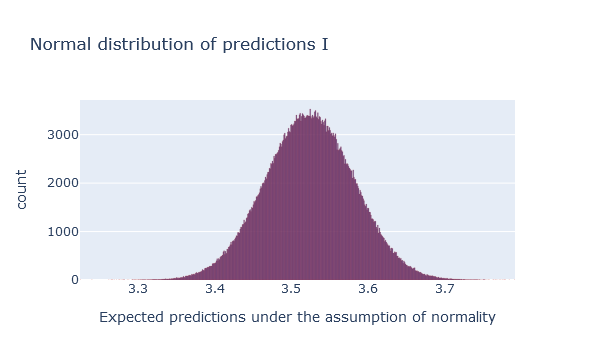

In [160]:
boston_normal_distribution_fig = \
px.histogram(boston_normal_distribution,
             color_discrete_sequence = ['darkslateblue'],
             title='Normal distribution of predictions I')

boston_normal_distribution_fig.update_traces(marker_line_color='firebrick',
                                             marker_line_width=0.2)

boston_normal_distribution_fig.update_layout(showlegend=False,
                                             xaxis_title_text=\
                                             "Expected predictions under the assumption of normality")

boston_normal_distribution_fig.show()

<p>
The sampling distributions allows to derive conclusions or inferences about the
the true population of predictions.
</p>

<p>
The sampling is a core tool of inferential statistics.<br>
In machine learning predictions are evaluated by comparing true with false predictions.<br>
In classification the comparison method of choice is the confusion matrix often with the target of
<a href="https://www.sciencedirect.com/topics/engineering/confusion-matrix" target="_blank">accuracy</a>.<br>
In regression problems the preferred  method of evaluation is the:<br>
</p>

#### Root mean squared error
<p>
This compares predictions with the price target variable set.
</p>
    

In [161]:
boston_mse = mean_squared_error(y_test_boston, boston_predictions_1)
print(boston_mse )

475.97193683412775


<p>The RMSE brings the MSE into the units of the data.</p>

In [162]:
boston_rmse = np.sqrt(mean_squared_error(y_test_boston, boston_predictions_1))
print(boston_rmse)
print("Price RMSE: $ {} ".format(round(boston_rmse, 2)))

21.8167810832425
Price RMSE: $ 21.82 


<p>
The goal of ML is to make good predictions.<br>
Good predictions are measured with the ML metric, in this case the RMSE.<br>
A core approach is to increase the quality and amount of data (Big Data).<br>
Different methods are applied to lower the RMSE like particular algos, feature engineering, hyperparameter tuning, grid search, cross validation and others.<br>
An example of hyperparameter tuning is given below:
</p>


In [163]:
boston_xgb_regressor_2 = \
xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.2, learning_rate=0.1,
                 max_depth=5, alpha = 10, n_estimators = 100)

boston_xgb_regressor_2.fit(X_train_boston, y_train_boston)

boston_predictions_2 = boston_xgb_regressor_2.predict(X_test_boston)

boston_rmse_2 = np.sqrt(mean_squared_error(y_test_boston, boston_predictions_2))

print("Boston price RMSE: $ {} ".format(round(boston_rmse, 2)))
print("Boston price RMSE: $ {} ".format(round(boston_rmse_2, 2)))

Boston price RMSE: $ 21.82 
Boston price RMSE: $ 3.95 


<p>
Tuning the hyperparameters lowered the RMSE around 18 Dollar .
</p>

### Scikit implementation of XGB
<p>
is aligned with Scikit and offers additional features.
</p>

In [164]:
scikit_xgb_reg = \
xgb.XGBRegressor(objective="reg:squarederror", random_state=4, eval_metric=mean_squared_error,
                 verbose=False)

scikit_xgb_reg_result = \
scikit_xgb_reg.fit(X_train_boston, y_train_boston, 
                   eval_set=[(X_test_boston, y_test_boston)],verbose=False)

scikit_xgb_reg_pred = \
scikit_xgb_reg.predict(X_test_boston)

scikit_xgb_reg_mse = \
mean_squared_error(y_test_boston, scikit_xgb_reg_pred)

scikit_xgb_reg_rmse = \
np.sqrt(scikit_xgb_reg_mse)

[13:57:14] WARNING: D:\bld\xgboost-split_1634712635879\work\src\learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




In [165]:
print(f"scikit_xgb_reg_mse: {scikit_xgb_reg_mse}")
print(f"scikit_xgb_reg_rmse: {scikit_xgb_reg_rmse}")

scikit_xgb_reg_mse: 9.440515301174957
scikit_xgb_reg_rmse: 3.0725421561265773


In [166]:
scikit_xgb_reg_evals_result=scikit_xgb_reg_result.evals_result()
scikit_xgb_reg_evals_result_df = \
pd.DataFrame.from_dict(scikit_xgb_reg_evals_result['validation_0'])

print(scikit_xgb_reg_evals_result_df.info())
print(scikit_xgb_reg_evals_result_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   rmse    100 non-null    float64
dtypes: float64(1)
memory usage: 928.0 bytes
None
        rmse
0  18.195585
1  13.436749
2  10.072140
3   7.825218
4   6.207634


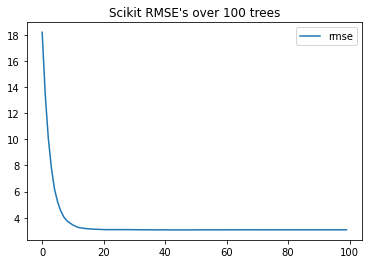

In [167]:
scikit_xgb_reg_evals_result_df.plot(title="Scikit RMSE's over 100 trees")
plt.show()

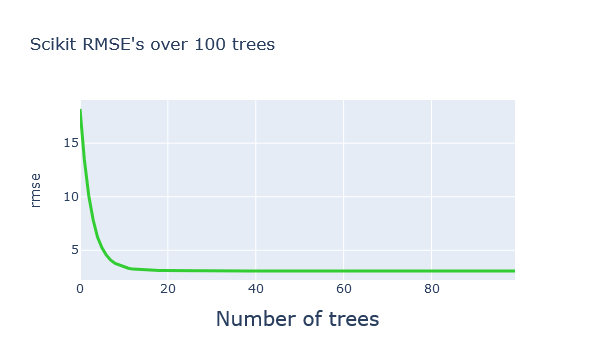

In [168]:
scikit_xgb_reg_evals_result_figure = \
px.line(scikit_xgb_reg_evals_result_df,
        y='rmse',
        x=scikit_xgb_reg_evals_result_df.index.tolist(),
        color_discrete_sequence=['limegreen'],
        title="Scikit RMSE's over 100 trees")

scikit_xgb_reg_evals_result_figure.update_traces(line_width=3)
scikit_xgb_reg_evals_result_figure.update_layout(xaxis_title_text="Number of trees", 
                                                 xaxis_title_font_size=20)

scikit_xgb_reg_evals_result_figure.show()
# Are thest the training or test RMSE's

#### Scikit min-max RMSE's

In [169]:
scikit_mask_max=\
(scikit_xgb_reg_evals_result_df['rmse'] == scikit_xgb_reg_evals_result_df['rmse'].max())
scikit_max_rmse = scikit_xgb_reg_evals_result_df[scikit_mask_max]

print(scikit_max_rmse)

        rmse
0  18.195585


In [170]:
scikit_mask_min=\
(scikit_xgb_reg_evals_result_df['rmse'] == scikit_xgb_reg_evals_result_df['rmse'].min())
scikit_min_rmse = scikit_xgb_reg_evals_result_df[scikit_mask_min]

print(scikit_min_rmse)

        rmse
43  3.064918


<p>
Another method to improve the predictions is cross validation.<br>
It creates more robust models by reducing overfitting on the training data.<br>
thereby making the predictions on the unseen test data worse.
</p>

#### Cross validation

<p>
XGB has implemented a native cross validation method.<br>
Specially the params method is helpful.<br>
It allows to input the hyperparameters of the algorithm as a dict into 
the cross validation reshuffling of the data.<br>
<a href="https://xgboost.readthedocs.io/en/latest/python/python_api.html?highlight=cross%20validation#xgboost.cv" target="_blank">xgboost.readthedocs</a> 

</p>

In [171]:
boston_cv_params = \
{"objective":"reg:squarederror", "colsample_bytree":0.3,
"learning_rate":0.1, "max_depth":5, "alpha":10}

print(boston_cv_params )

{'objective': 'reg:squarederror', 'colsample_bytree': 0.3, 'learning_rate': 0.1, 'max_depth': 5, 'alpha': 10}


In [172]:
# , "n_estimators" = num_boost_round = n trees
boston_cv_1 = \
xgb.cv(dtrain=boston_dmatrix, params=boston_cv_params, nfold=5,
       num_boost_round=200, early_stopping_rounds=5,
       metrics='rmse', as_pandas=True, seed=273)

#### RMES's per boosting round or tree

In [173]:
# This should be a pandas data frame
print(type(boston_cv_1))
print(boston_cv_1.info())

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   train-rmse-mean  187 non-null    float64
 1   train-rmse-std   187 non-null    float64
 2   test-rmse-mean   187 non-null    float64
 3   test-rmse-std    187 non-null    float64
dtypes: float64(4)
memory usage: 6.0 KB
None


In [174]:
boston_cv_1.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,21.744638,0.104082,21.749311,0.460254
1,19.799115,0.115356,19.829794,0.448630
2,18.018912,0.154472,18.071375,0.418583
3,16.444248,0.120976,16.509477,0.446448
4,15.007556,0.156754,15.099884,0.438337


In [175]:
boston_cv_1[['train-rmse-mean', 'test-rmse-mean']].agg(['min', 'max'])

,train-rmse-mean,test-rmse-mean
min,1.302930,3.370206
max,21.744638,21.749311


<p>
The essential test-rmse-mean is with 3.471946 slightly higher than above.<br>
Hyperparameter tuning with grid search might improve the results.
</p>

#### Adding trees or boosting rounds 
<p>improves the results up to a point.</p>


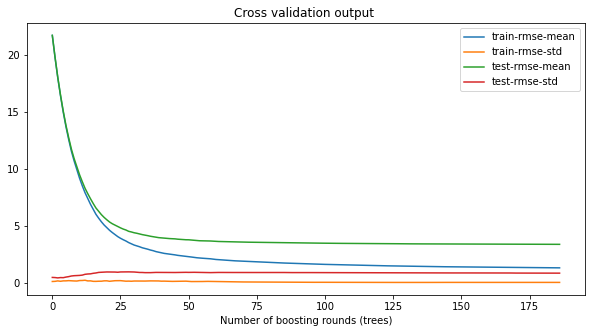

In [176]:
boston_cv_1.plot(figsize=(10,5), title="Cross validation output ")
plt.xlabel("Number of boosting rounds (trees)")
plt.show()

#### Plotting the trees
<p>generated with xgb.<br>
This gives insight into the creation of the particular tree.
</p>

In [177]:
boston_xg_reg_trainOnly = \
xgb.train(params=boston_cv_params, dtrain=boston_dmatrix, num_boost_round=10)

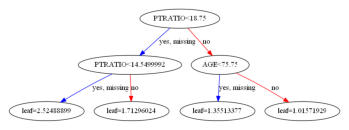

In [178]:
xgb.plot_tree(boston_xg_reg_trainOnly, num_trees=4)
plt.rcParams['figure.figsize'] = [40, 40]
plt.show()

#### Feature importance
<p>
The consideration here is that the number of times a feature is used in splitting the tree,<br>
increases the feature importance of the tree.<br>
According to the graphic below LSTAT (LSTAT % lower status of the population)  is the most important feature, used in 16 splits.
</p>

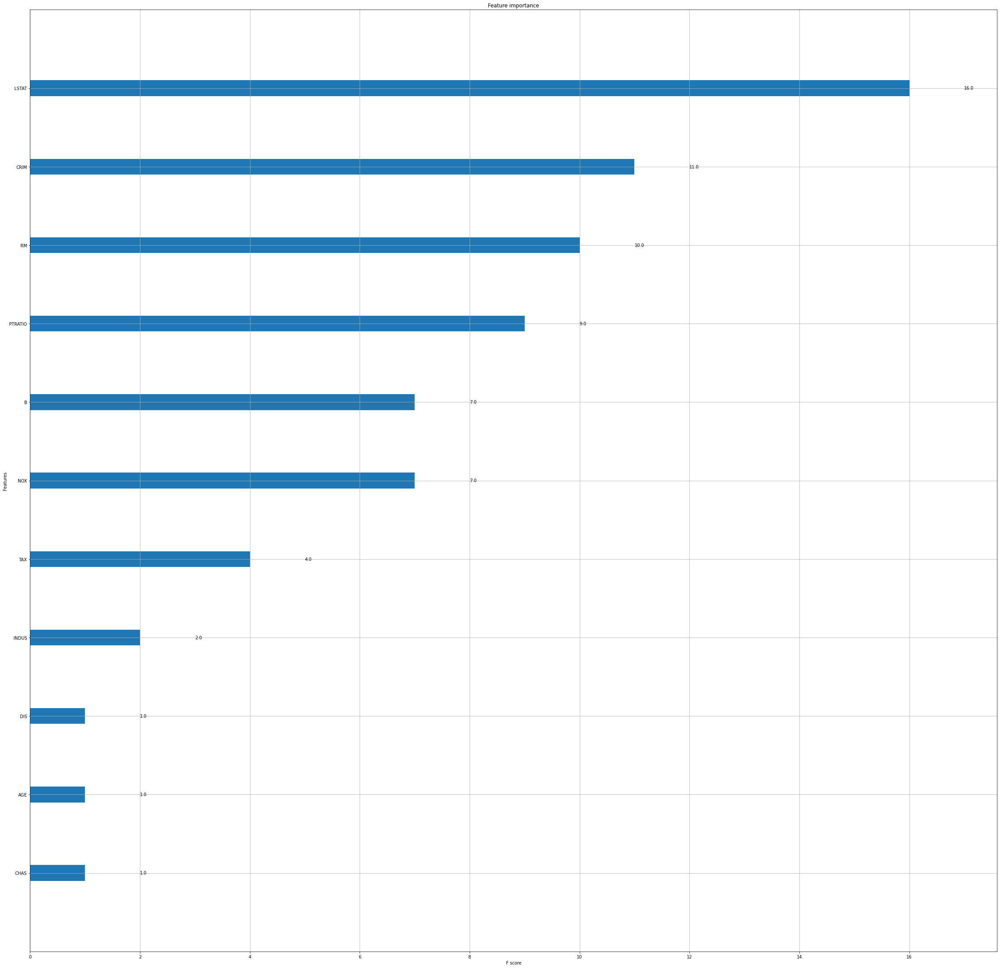

In [179]:
xgb.plot_importance(boston_xg_reg_trainOnly)
plt.rcParams['figure.figsize'] = [8, 8]
plt.show()